In [1]:
import matplotlib.pyplot as plt
import scanpy as sc
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os

import matplotlib as mpl
# enables correct plotting of text
mpl.rcParams['pdf.fonttype'] = 42
mpl.rcParams['ps.fonttype'] = 42 

import scanpy.external as sce

In [2]:
# import session_info
# session_info.show()

In [3]:
import importlib.util
import sys
spec = importlib.util.spec_from_file_location("module.name", "/home/kk837/rfs/rfs-teichlab-nfs-iCNyzSAaucw/kk837/function/python/utils.py")
utils = importlib.util.module_from_spec(spec)
sys.modules["module.name"] = utils
spec.loader.exec_module(utils)

/home/kk837/rfs/rfs-teichlab-nfs-iCNyzSAaucw/kk837/function/python/utils.py:356: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('scanpy')` instead
  if sc.__version__.startswith("1.4"):


In [4]:
sc.settings.set_figure_params(dpi=80)

# Variables

In [5]:
adata_dir = '/rfs/project/rfs-iCNyzSAaucw/kk837/data_objects/Foetal/Xenium/TACCO/subsets'
celltype = 'EndothelialCells'

In [6]:
latent_space = 'pca_harmony'

# Read in data

In [7]:
# read in
adata = sc.read_h5ad(f'{adata_dir}/{celltype}_lognorm.h5ad')
adata

AnnData object with n_obs × n_vars = 10891 × 4579
    obs: 'cell_id', 'x_centroid', 'y_centroid', 'transcript_counts', 'control_probe_counts', 'genomic_control_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'total_counts', 'cell_area', 'nucleus_area', 'nucleus_count', 'segmentation_method', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'pct_counts_in_top_10_genes', 'pct_counts_in_top_20_genes', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_150_genes', 'n_counts', 'n_genes', 'tissue_block_id', 'celltypist_coarse', 'conf_score_coarse', 'celltypist_coarse_fin', 'celltypist_coarse2midmod', 'conf_score_coarse2midmod', 'celltypist_mid_fin', 'celltypist_midmod2fine', 'conf_score_midmod2fine', 'pca_harmony_leiden_0.2', 'pca_harmony_leiden_0.3', 'pca_harmony_leiden_0.4', 'pca_harmony_leiden_0.5', 'pca_harmony_leiden_0.8', 'pca_harmony_leiden_1.0', 'pca_harmony_leiden_1.5', 'pca_harmony_leiden_2.0', 'pca_harmony_leiden_3

In [8]:
adata.X.data[:5]

array([3.34893967, 3.34893967, 3.34893967, 3.34893967, 3.34893967])

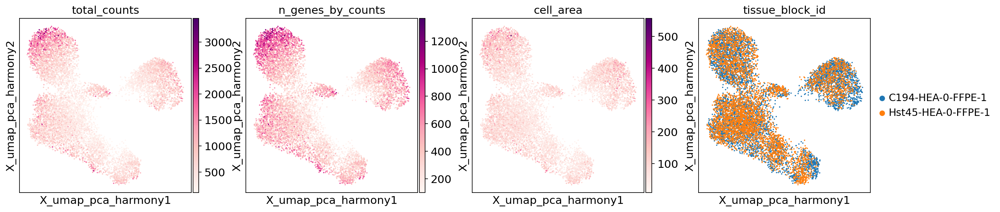

In [9]:
sc.pl.embedding(adata, basis=f"X_umap_{latent_space}",
                color=['total_counts','n_genes_by_counts','cell_area','tissue_block_id'],
                    wspace=0.2,cmap='RdPu',vmax='p100')

In [23]:
%%time
# leiden clustering
resolutions_list = [# 0.2,0.4,0.6,1, # already done
                    1.2,1.5,2,3,4]
for resolution in resolutions_list:
    sc.tl.leiden(adata,neighbors_key=latent_space,
                     resolution=resolution,key_added=f'leiden_{str(resolution)}',n_iterations=2)

CPU times: user 9.17 s, sys: 53.9 ms, total: 9.23 s
Wall time: 9.24 s


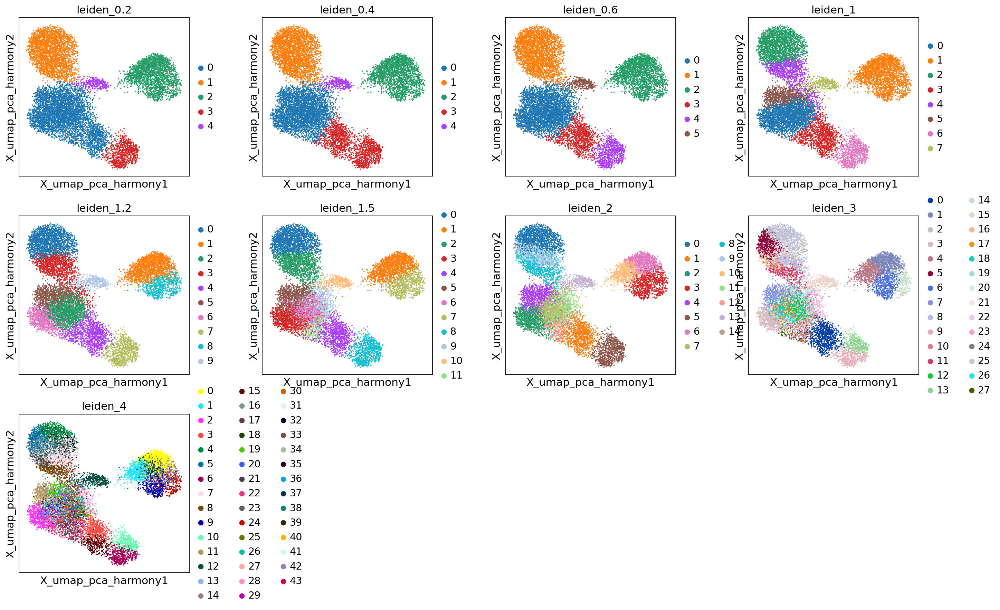

In [24]:
sc.pl.embedding(adata, basis=f"X_umap_{latent_space}",
                color=[f'leiden_{str(resolution)}' for resolution in [0.2,0.4,0.6,1,1.2,1.5,2,3,4]],
                wspace=0.3)

In [28]:
# read in markers identified using single-nucleus data
markers_df_BEC = pd.read_csv(f'/rfs/project/rfs-iCNyzSAaucw/kk837/notebooks/Foetal/VisiumHD/re-seq_mpp0p3/sc_BloodVesselEndothelialCells_finegrain_markers.csv')
markers_df_Endo = pd.read_csv(f'/rfs/project/rfs-iCNyzSAaucw/kk837/notebooks/Foetal/VisiumHD/re-seq_mpp0p3/sc_EndocardialCells_finegrain_markers.csv')
markers_df = pd.concat([markers_df_BEC,markers_df_Endo])

mask1 = markers_df['group_mean']>1
mask2 = markers_df['logfoldchanges']>1
markers_df = markers_df[mask1&mask2]

markers = {}
n_top = 15
for c in set(markers_df['group']):
    markers_df_sub = markers_df[markers_df['group']==c]
    markers_df_sub.sort_values('logfoldchanges',ascending=False)
    markers[c]=list(markers_df_sub[:n_top]['names'])

# manually add genes
markers['LEC'] = ['LYVE1','CCL19','CCL21','PROX1',"FLT4","PDPN"]
markers['Cycling'] = ['MKI67','TOP2A']

genes = []
for g in markers.values():
    genes = genes + [x for x in g if (x in list(adata.var_names))&(x not in genes)]
for key in markers.keys():
    markers[key]=[x for x in markers[key] if x in list(adata.var_names)]
len(genes)

52

In [29]:
markers

{'EndocardialCells': ['NPR3',
  'ADGRG6',
  'TMEM100',
  'SMOC1',
  'CDH11',
  'CALCRL',
  'HMCN1'],
 'GreatVesselVenousEndothelialCells': ['FBLN2',
  'TGM2',
  'CDH11',
  'NTS',
  'LEPR',
  'HMCN1',
  'ADGRG6'],
 'EndocardialCushionCells': ['BMP4',
  'PROX1',
  'PDGFRA',
  'HAS2',
  'SOX6',
  'APCDD1',
  'HMGA2',
  'RASSF8'],
 'CoronaryArterialEndothelialCells': ['ELN',
  'SULF1',
  'FBLN5',
  'GJA5',
  'JAG1',
  'FBLN2',
  'TGM2',
  'CFH'],
 'CoronaryVenousEndothelialCells': ['APLNR',
  'PRCP',
  'TGFBR2',
  'NRP2',
  'PLVAP',
  'EBF1',
  'ITGA6',
  'PPP3CA',
  'ADGRL4'],
 'CoronaryCapillaryEndothelialCells': ['COL4A1',
  'COL4A2',
  'H19',
  'PDGFB',
  'ETS1',
  'MYO1B'],
 'GreatVesselArterialEndothelialCells': ['ELN',
  'SULF1',
  'PDE3A',
  'HMCN1',
  'FSTL1',
  'FBLN5',
  'MEIS2'],
 'ValveEndothelialCells': ['AKR1B1', 'ASPN', 'CTNNAL1', 'TSPO'],
 'LEC': ['CCL19', 'PROX1', 'FLT4', 'PDPN'],
 'Cycling': ['MKI67', 'TOP2A']}

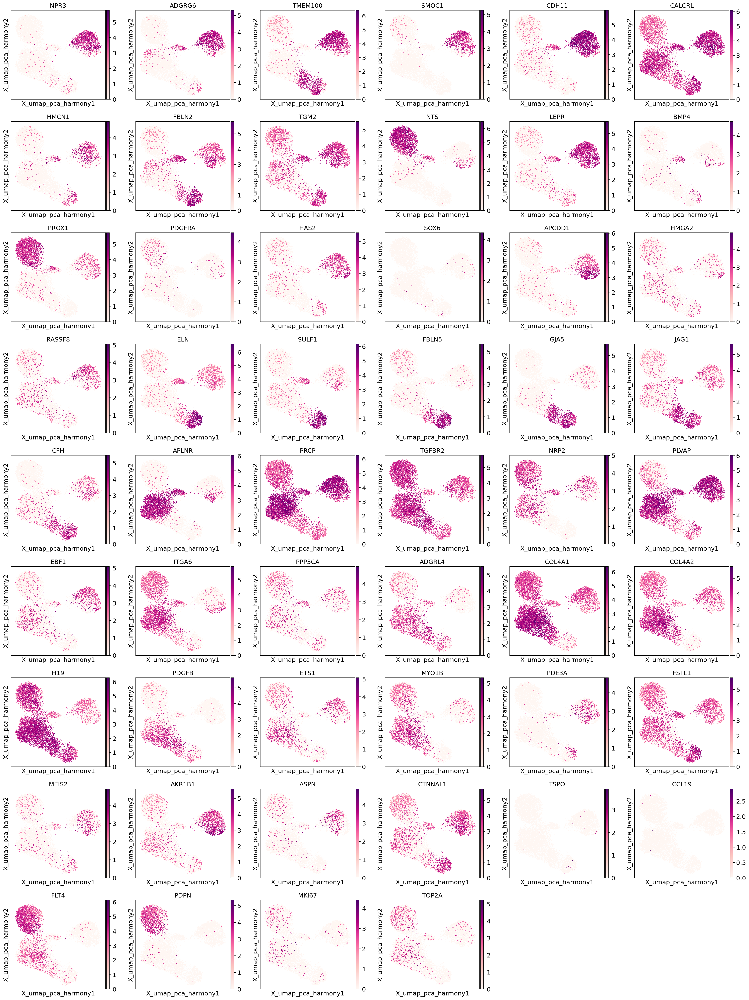

In [30]:
sc.pl.embedding(adata,basis=f"X_umap_{latent_space}",color=genes, size=10,
               ncols=6, wspace=0.2,cmap='RdPu',vmax='p100')

# Select a resolution

In [20]:
resolution_sel = 1

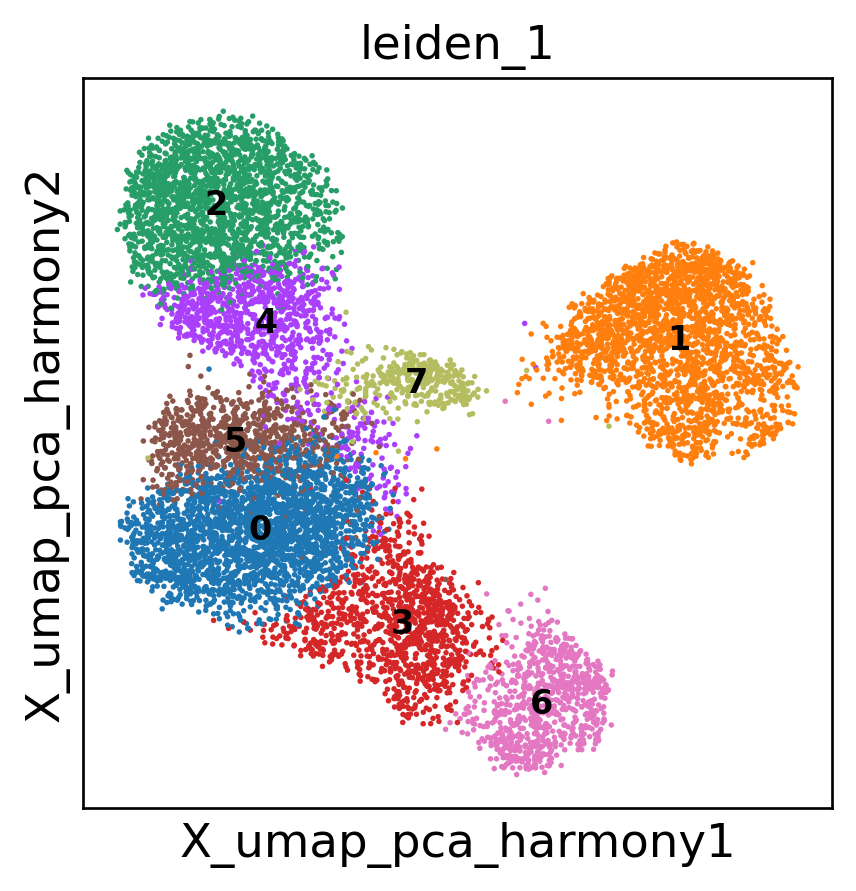

In [21]:
sc.settings.set_figure_params(dpi=120)
sc.pl.embedding(adata,
                    basis=f"X_umap_{latent_space}",
                    color=f'leiden_{str(resolution_sel)}',
                   legend_loc='on data',legend_fontsize=10
                   )
sc.settings.set_figure_params(dpi=80)

categories: 0, 1, 2, etc.
var_group_labels: EndocardialCells, GreatVesselVenousEndothelialCells, EndocardialCushionCells, etc.


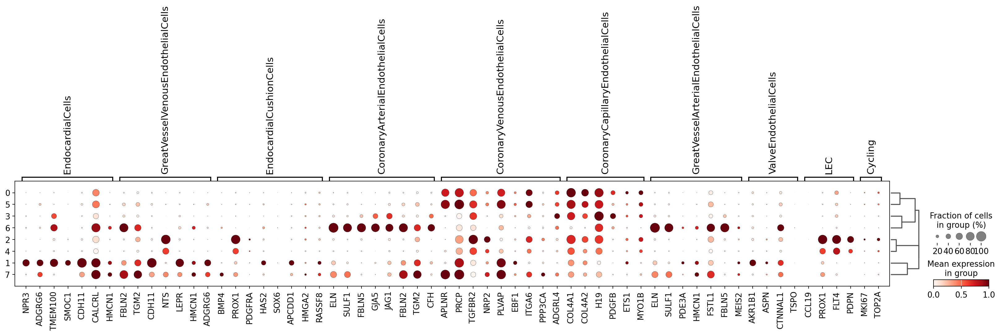

In [31]:
sc.tl.dendrogram(adata,groupby=f'leiden_{str(resolution_sel)}')
sc.pl.dotplot(adata,
              var_names=markers,
              groupby=f'leiden_{str(resolution_sel)}',
              standard_scale='var',
              dendrogram=True
             )

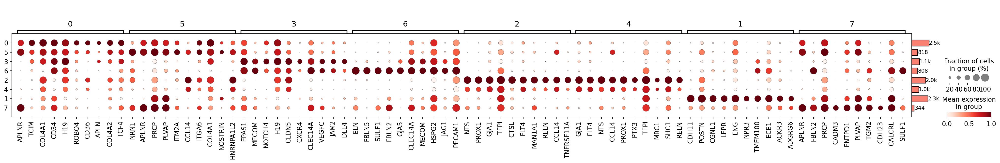

In [25]:
# DEG analysis
adata.uns['log1p']['base']=None
sc.tl.rank_genes_groups(adata,groupby=f'leiden_{str(resolution_sel)}')
sc.tl.dendrogram(adata, groupby=f'leiden_{str(resolution_sel)}')
dp=sc.pl.rank_genes_groups_dotplot(adata, dendrogram=True, standard_scale='var', return_fig=True)
dp.add_totals().show()

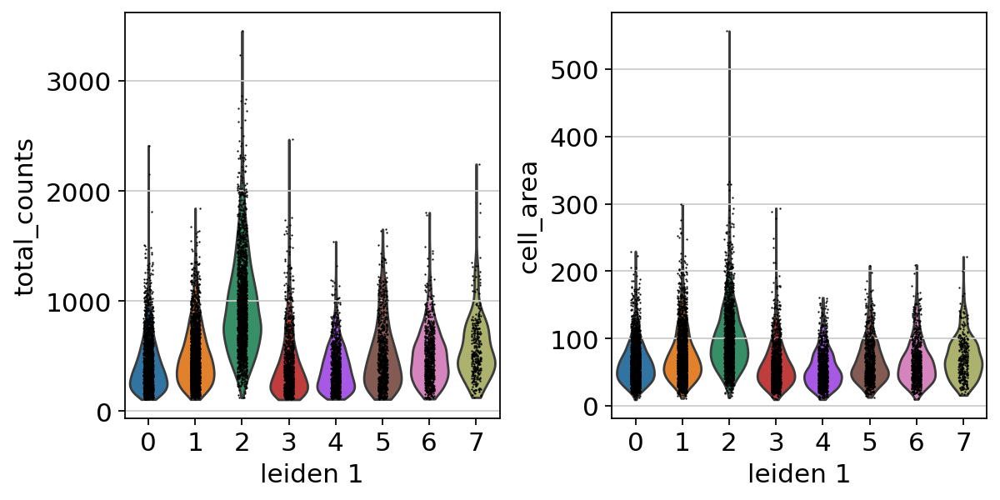

In [26]:
# QC metrices
sc.pl.violin(adata,keys=['total_counts','cell_area'],groupby=f'leiden_{str(resolution_sel)}')

categories: 0, 1, 2, etc.
var_group_labels: CM, vCM, aCM, etc.


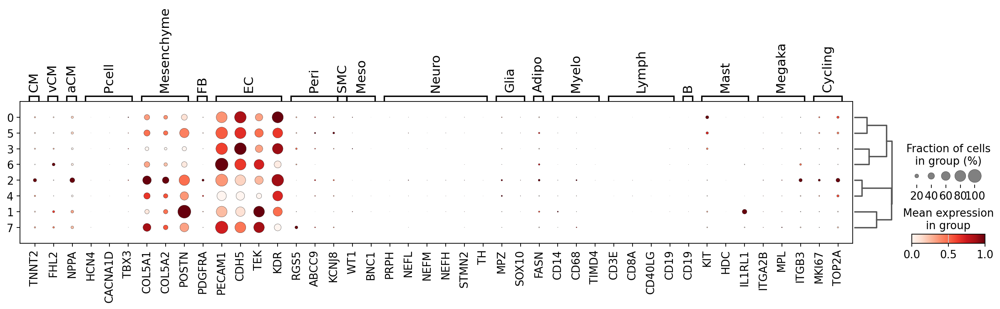

In [27]:
# coarse-grained markers
coarse_markers = {
    'CM': ['TTN', 'TNNT2','MYH6'],
    'vCM': ['MYH7', 'MYL2', 'FHL2'],
    'aCM': ['NPPA', 'MYL7', 'MYL4'],
    'Pcell':['HCN1','HCN4','CACNA1D','TBX3','SHOX2'],
    'Mesenchyme':['COL5A1','COL5A2','POSTN'], # markers in the Xenium5000 panel
    'FB': ['DCN', 'GCN', 'PDGFRA','COL1A1','COL1A2'],
    'EC': ['VWF', 'PECAM1', 'CDH5','RGCC', 'FABP5','TEK','KDR','LYVE1','CCL21'],
    'Peri': ['RGS5', 'ABCC9', 'KCNJ8'],
    'SMC': ['MYH11', 'TAGLN', 'ACTA2'],
    'Meso': ['MSLN', 'WT1', 'BNC1'],
    'Neuro': ['PLP1', 'NRXN1', 'NRXN3','PRPH', 'NEFL', 'NEFM', 'NEFH', 'STMN2', 'SST', 'SLC10A4', 'SLC18A3', 'TH', 'NPY'],
    'Glia':['MPZ','PLP1','SOX10'],
    'Adipo': ['GPAM', 'FASN', 'LEP'],
    'Myelo': ['CD14', 'C1QA', 'CD68','LYVE1','TIMD4','CCR2','MPO'],
    'Lymph': ['CD3E','CD3D','CD8A','IL7R', 'CD40LG','CD19','SDC1','IGHG1','IGHA1'],
    'B': ['CD19','SDC1','IGHG1','IGHA1'],
    'Mast': ['KIT', 'CPA3','HDC','IL1RL1'],
    'Megaka':['ITGA2B','MPL','ITGB3', 'TUBB1', 'PPBP'],
    'Cycling':['MKI67','TOP2A'],
}

for key in coarse_markers.keys():
    coarse_markers[key]=[x for x in coarse_markers[key] if x in adata.var_names]

sc.tl.dendrogram(adata, groupby=f'leiden_{str(resolution_sel)}')
sc.pl.dotplot(adata,
              coarse_markers, 
              groupby=f'leiden_{str(resolution_sel)}',
              dendrogram=True,
              standard_scale="var",
              color_map="Reds",
              swap_axes=False,
             )

# Annotate

In [33]:
# annotate
adata.obs['fine_grain_manual'] = adata.obs[f'leiden_{str(resolution_sel)}'].copy()
adata.obs.replace({'fine_grain_manual':{
    '0':'CoronaryVenousEndothelialCells',
    '1':'EndocardialCells',
    '2':'LymphaticEndothelialCells',
    '3':'CoronaryCapillaryEndothelialCells',
    '4':'LymphaticEndothelialCells',
    '5':'CoronaryVenousEndothelialCells',
    '6':'ArterialEndothelialCells',
    '7':'GreatVesselVenousEndothelialCells',
}},inplace=True)
adata.obs['fine_grain_manual'].value_counts()

/tmp/ipykernel_2026351/2308029709.py:3: FutureWarning: The behavior of Series.replace (and DataFrame.replace) with CategoricalDtype is deprecated. In a future version, replace will only be used for cases that preserve the categories. To change the categories, use ser.cat.rename_categories instead.
  adata.obs.replace({'fine_grain_manual':{


fine_grain_manual
CoronaryVenousEndothelialCells       3298
LymphaticEndothelialCells            3013
EndocardialCells                     2308
CoronaryCapillaryEndothelialCells    1120
ArterialEndothelialCells              808
GreatVesselVenousEndothelialCells     344
Name: count, dtype: int64

In [ ]:
CoronaryCapillaryEndothelialCells                      7259
CoronaryCapillaryEndothelialCellsNOTCHpos              1579
CoronaryVenousEndothelialCells                         1493
CoronaryCapillaryEndothelialCellsCycling               1414
GreatVesselVenousEndothelialCells                      1145
CoronaryArterialEndothelialCells                        504
GreatVesselArterialEndothelialCells                     472
CoronaryCapillaryEndothelialCells_DoubletsWithEryth     199

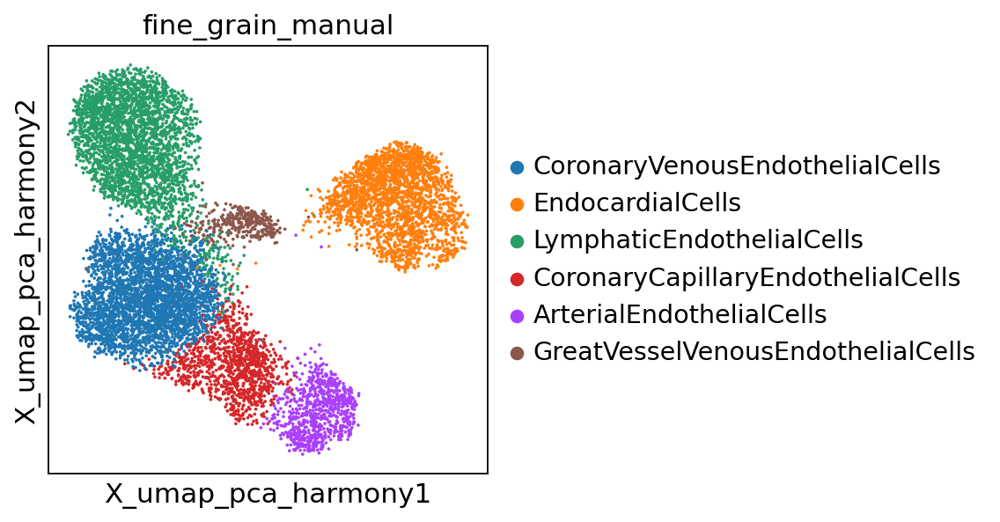

In [34]:
sc.pl.embedding(adata, basis=f"X_umap_{latent_space}",
                color='fine_grain_manual',
                wspace=0.3)

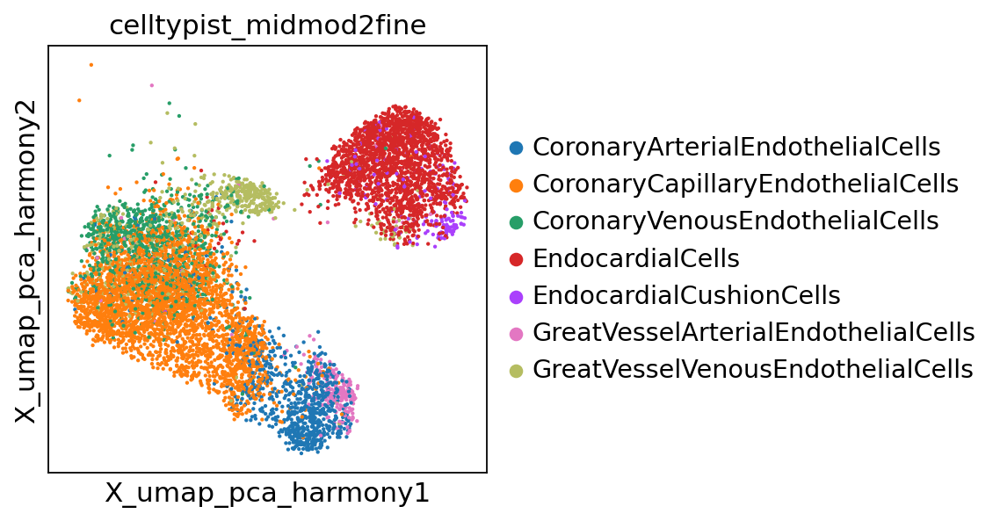

/home/kk837/.conda/envs/generic_env/lib/python3.10/site-packages/scanpy/plotting/_utils.py:465: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[f"{value_to_plot}_colors"] = colors_list


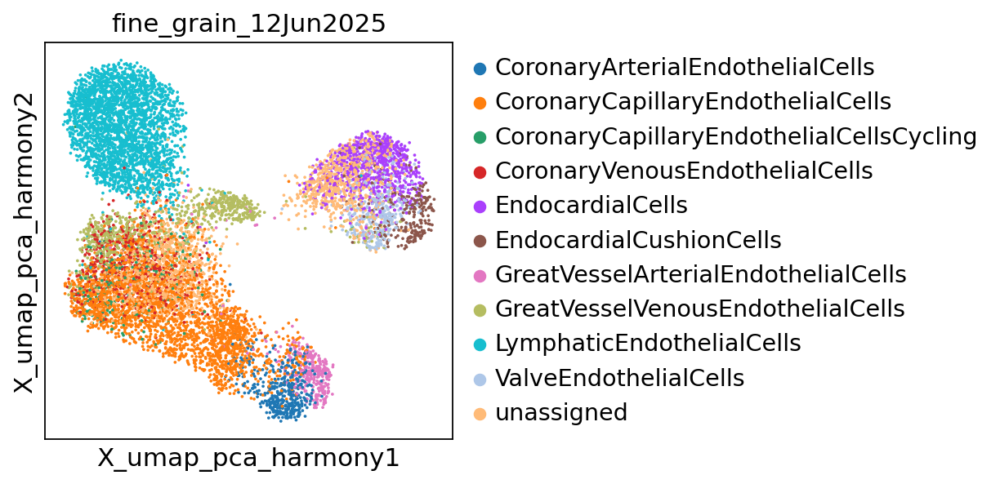

In [35]:
for group_col in ['celltypist_midmod2fine','fine_grain_12Jun2025']:
    val_counts = adata.obs[group_col].value_counts()
    celltype_sel = val_counts.index[val_counts>(adata.shape[0]*0.01)]
    ad = adata[adata.obs[group_col].isin(celltype_sel)]
    sc.pl.embedding(ad,
                        basis=f"X_umap_{latent_space}",
                        color=group_col,
                       )

# Save

In [36]:
# save
adata.write(f'{adata_dir}/{celltype}_lognorm.h5ad')
print(f'{adata_dir}/{celltype}_lognorm.h5ad')

/rfs/project/rfs-iCNyzSAaucw/kk837/data_objects/Foetal/Xenium/TACCO/subsets/EndothelialCells_lognorm.h5ad


# Plot on sections

In [37]:
# load original adata with spatial coordinates
adata_ori = sc.read_h5ad('/rfs/project/rfs-iCNyzSAaucw/kk837/data_objects/Foetal/Xenium/C194-HEA-0-FFPE-1_Hst45-HEA-0-FFPE-1_concat_5K_filtered_celltype-sel_raw.h5ad',
                        backed='r')
adata.obsm['spatial'] = adata_ori[adata.obs_names].obsm['spatial'].copy()

/tmp/ipykernel_2026351/82207579.py:3: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(slide,color=['fine_grain_manual'],# groups='SinoatrialNodePacemakerCells',


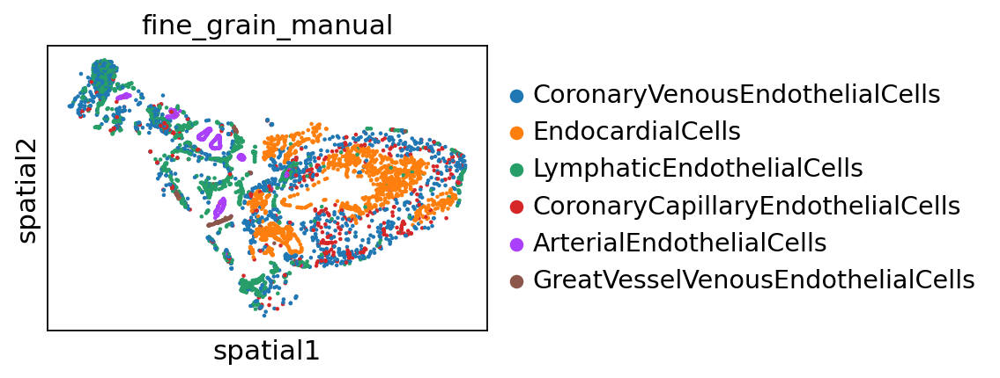

/tmp/ipykernel_2026351/82207579.py:3: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(slide,color=['fine_grain_manual'],# groups='SinoatrialNodePacemakerCells',


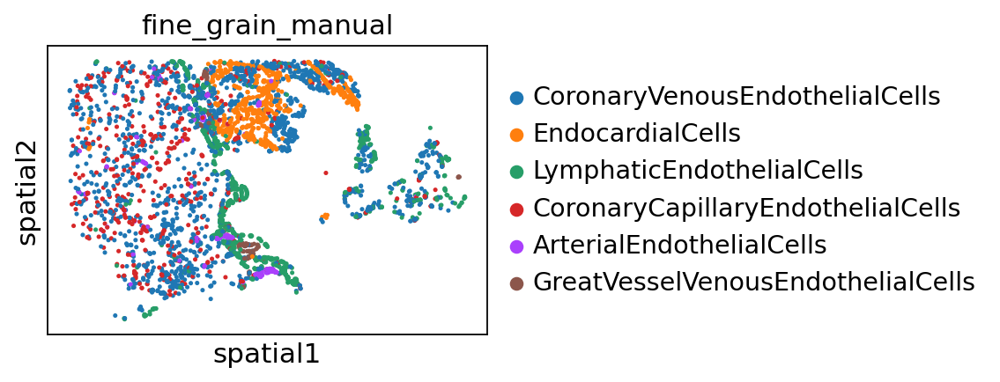

In [38]:
for tissue_id in ['C194-HEA-0-FFPE-1', 'Hst45-HEA-0-FFPE-1']:
    slide = adata[adata.obs['tissue_block_id']==tissue_id]
    sc.pl.spatial(slide,color=['fine_grain_manual'],# groups='SinoatrialNodePacemakerCells',
                  spot_size=100,vmax='p100')

/tmp/ipykernel_2026351/1089901179.py:4: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(slide,color=['fine_grain_manual'],groups=[celltype],


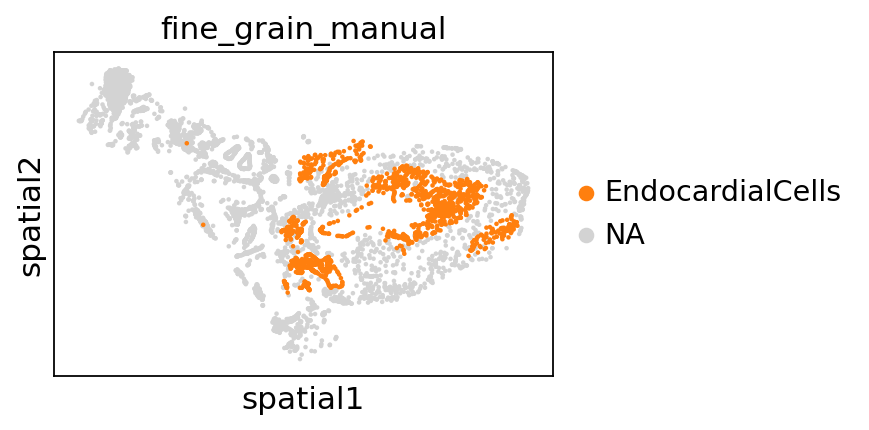

/tmp/ipykernel_2026351/1089901179.py:4: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(slide,color=['fine_grain_manual'],groups=[celltype],


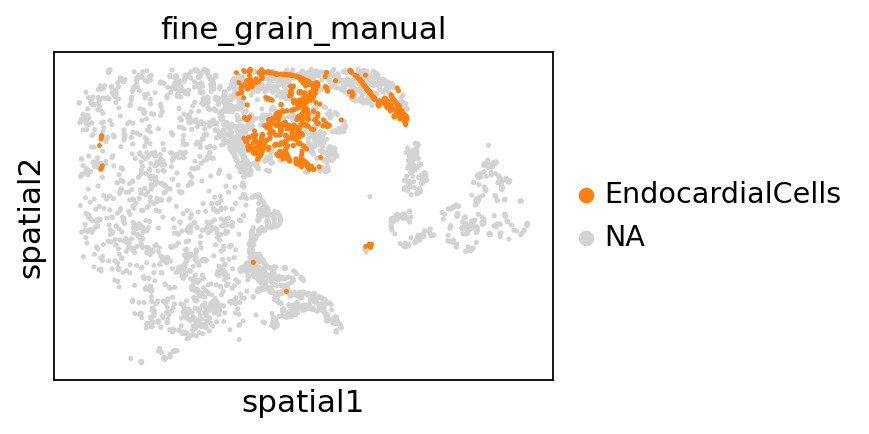

/tmp/ipykernel_2026351/1089901179.py:4: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(slide,color=['fine_grain_manual'],groups=[celltype],


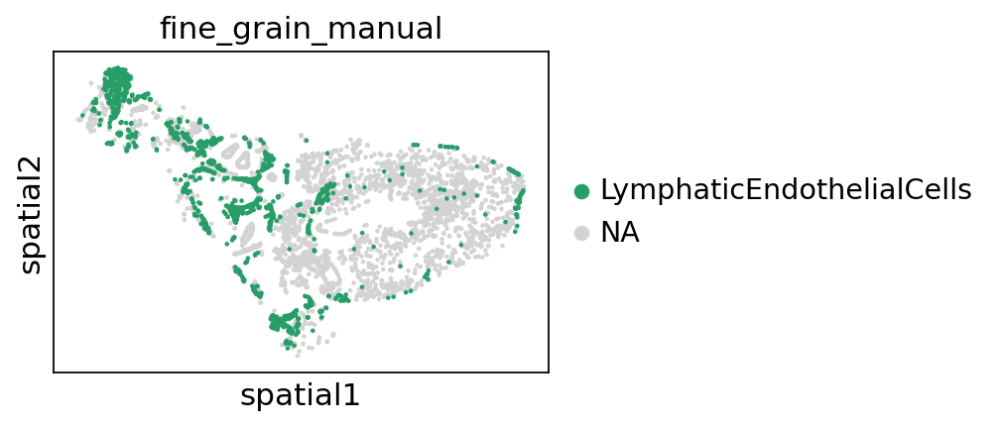

/tmp/ipykernel_2026351/1089901179.py:4: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(slide,color=['fine_grain_manual'],groups=[celltype],


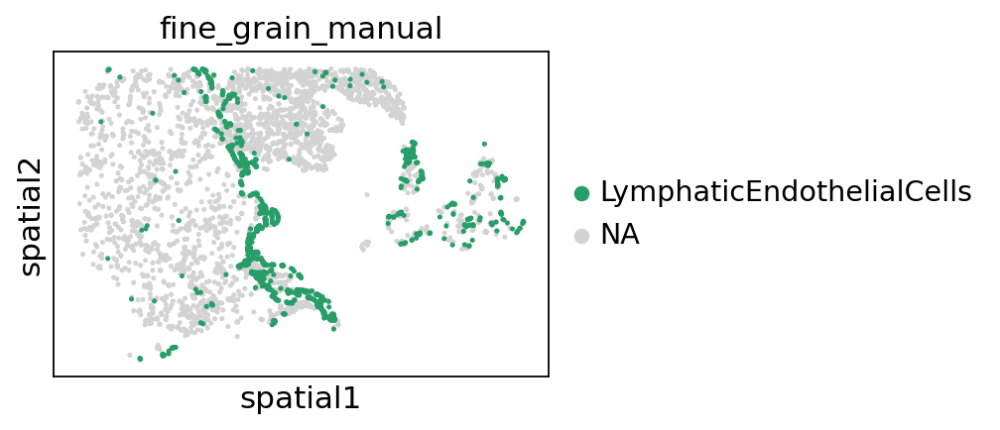

/tmp/ipykernel_2026351/1089901179.py:4: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(slide,color=['fine_grain_manual'],groups=[celltype],


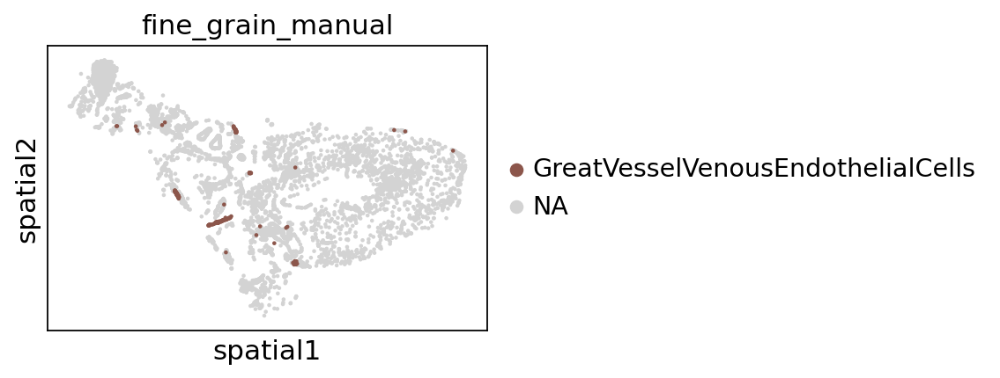

/tmp/ipykernel_2026351/1089901179.py:4: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(slide,color=['fine_grain_manual'],groups=[celltype],


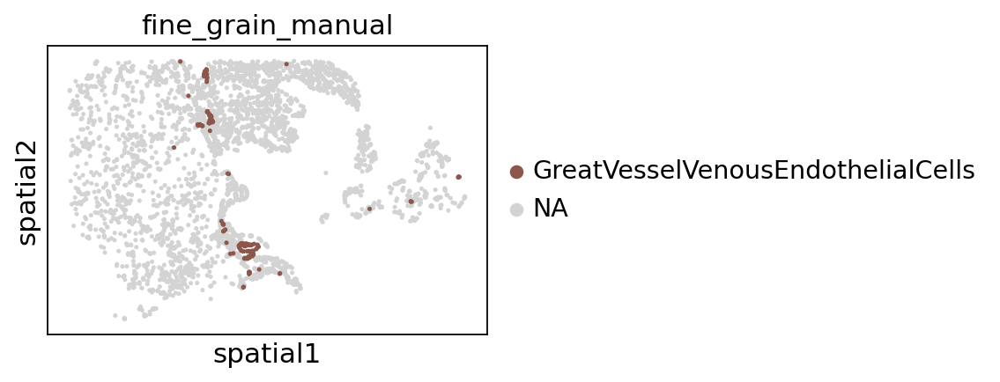

/tmp/ipykernel_2026351/1089901179.py:4: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(slide,color=['fine_grain_manual'],groups=[celltype],


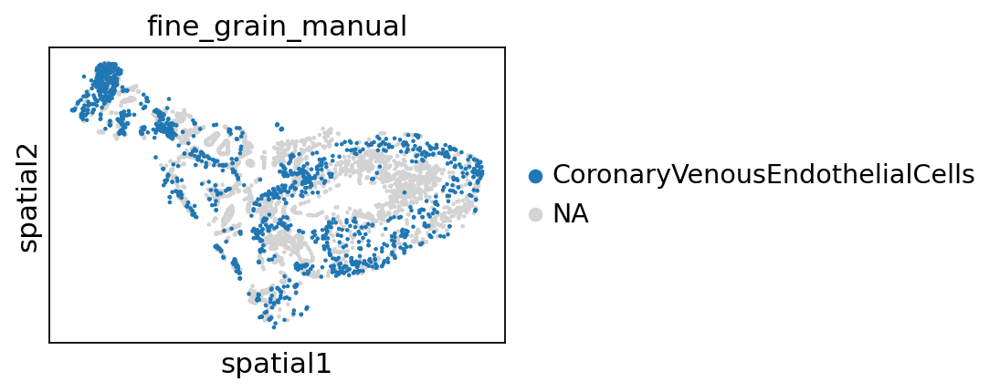

/tmp/ipykernel_2026351/1089901179.py:4: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(slide,color=['fine_grain_manual'],groups=[celltype],


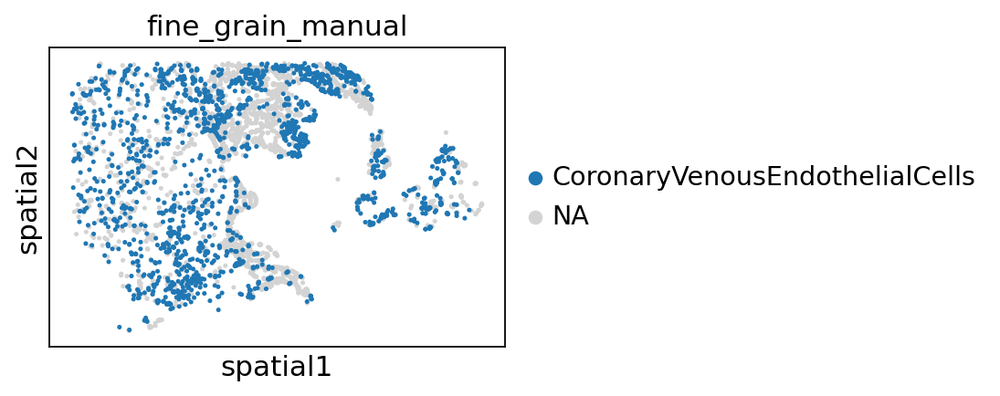

/tmp/ipykernel_2026351/1089901179.py:4: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(slide,color=['fine_grain_manual'],groups=[celltype],


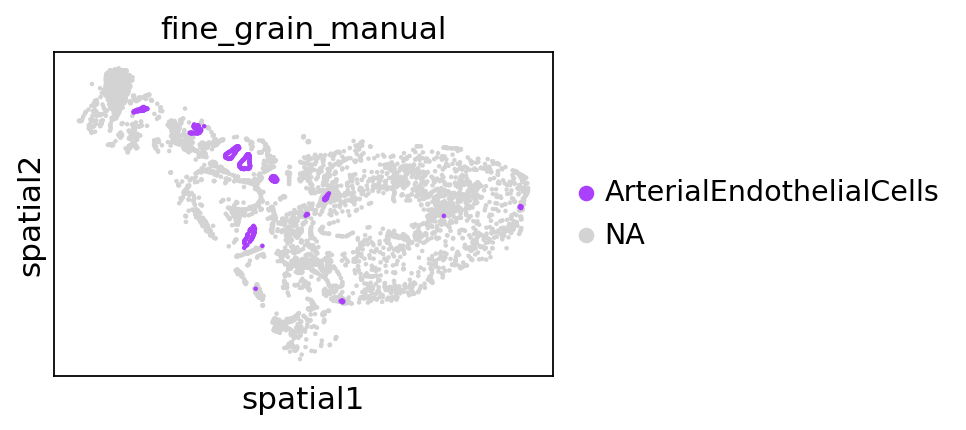

/tmp/ipykernel_2026351/1089901179.py:4: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(slide,color=['fine_grain_manual'],groups=[celltype],


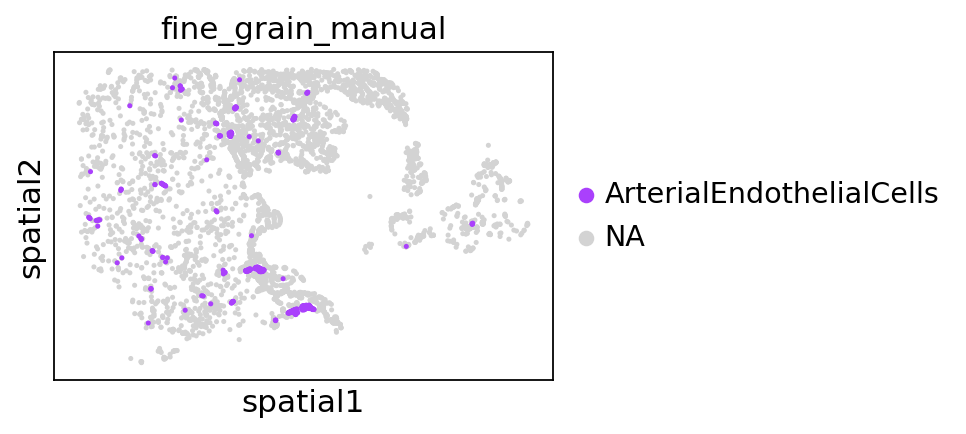

/tmp/ipykernel_2026351/1089901179.py:4: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(slide,color=['fine_grain_manual'],groups=[celltype],


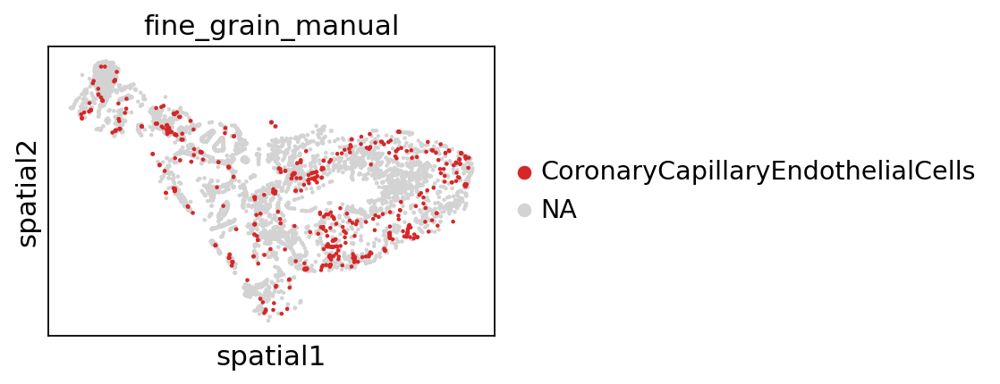

/tmp/ipykernel_2026351/1089901179.py:4: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(slide,color=['fine_grain_manual'],groups=[celltype],


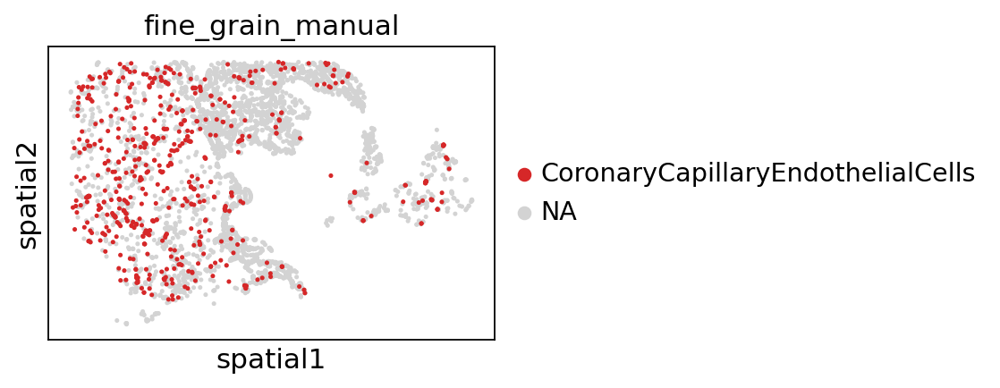

In [39]:
for celltype in set(adata.obs['fine_grain_manual']):
    for tissue_id in ['C194-HEA-0-FFPE-1', 'Hst45-HEA-0-FFPE-1']:
        slide = adata[adata.obs['tissue_block_id']==tissue_id]
        sc.pl.spatial(slide,color=['fine_grain_manual'],groups=[celltype],
                      spot_size=100,vmax='p100')